## Дз 8: "Metric learning"

## Цель задания:
Познакомится с алгоритмами metric learning
## Описание задания:
В рамках данного домашнего задания предлагается решить задачу поиска похожего автомобиля в базе данных (автомобиля того же класса). На основе датасета [cars196](https://paperswithcode.com/sota/metric-learning-on-cars196) , ссылка на данные [мета](https://drive.google.com/file/d/1PD-lbbcKSelDeAYKafe3boc5mqqEe7X7/view?usp=sharing) [data](https://drive.google.com/file/d/1l9EnYMC-xGX706SY1kN8RceMmFViASfx/view?usp=sharing).

Процесс выполнения задания следующий:

0. Выбор модели эмбеддера:
    1. Выберите модель кодирующую изображения для выполнения домашнего задания. Любую, кроме модели resnet50.

1. Подготовка обучающего набора данных
    1. Реализуйте корректный класс Dataset и Dataloader для выбранной модели (должен работать форвард вашей модели на том, что выходит из даталоадера).
    2. Добавьте аугментации в датасет **0.5 балла**.

2. Реализация корректного train-loop и обучение модели:  
    1. Реализуйте train-loop для вашей модели и проведите обучение c Triplet loss **2 балла**.
    2. При формировании триплета не просто брать отрицательный класс, а воспользоваться техникой hard negative mining **0.5 балла**.
    3. Обучите модель и воcпользуйте иными loss функциями для задачи metric learning **0.5 балла**.
    4. Полезные ссылки [тык](https://github.com/KevinMusgrave/pytorch-metric-learning)
 
3. Валидация обученных моделей на тестовой выборке, вычисление метрики Recall и Precision
    1. Оцените качество моделей на тестовой части данных и рассчитайте метрики поиска Recall@1, Recall@5, Precision@1, Precision@5. Обратите внимание, что для формирования предсказаний на тестовой выборке вы не должны предсказывать напрямую класс объекта, а должны производить поиск на основе получившихся эмбеддингов (пример в [семинаре](metric_learning.ipynb) блок Faiss). **0.5 балла**
    2. При поиске воспользоваться библиотекой Faiss **0.5 балла**

4. Выводы:
    1. Проанализируйте результаты обучения, визуально оцените качество работы модели.
    2. Прокомментируйте распространенные ошибки модели и предложите пути для улучшения финального решения.
    3. Проинтерпретируйте результаты работы модели с помощью [GradCam](https://github.com/jacobgil/pytorch-grad-cam)  **0.5 балла**

## Срок выполнения задания:
Данное задание можно сдать без штрафов до 18 марта.


In [58]:
%pip install grad-cam

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 24.1 MB/s eta 0:00:0000:0100:01
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.0-py3-none-any.whl size=38071 sha256=f14b8440a8dd0aaec410b0d08ba995470eb7b667c8b6abbdeaedef8022595385
  Stored in directory: /tmp/xdg_cache/pip/wheels/5b/e5/3d/8548241d5cffe53ad1476c566a61ad9bf09cc61a9430f09726
Successfully built grad-cam

[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: python3 -m pip install --upgrade pip


In [4]:
!rm -rf /home/jupyter/datasphere/project/voc2012

In [5]:
!rm -rf /home/jupyter/datasphere/project/VOCdevkit

In [8]:
!unzip /home/jupyter/datasphere/project/devkit.zip

Archive:  /home/jupyter/datasphere/project/devkit.zip
   creating: devkit/
  inflating: __MACOSX/._devkit       
  inflating: devkit/cars_test_annos.mat  
  inflating: __MACOSX/devkit/._cars_test_annos.mat  
  inflating: devkit/eval_train.m     
  inflating: __MACOSX/devkit/._eval_train.m  
  inflating: devkit/cars_meta.mat    
  inflating: __MACOSX/devkit/._cars_meta.mat  
  inflating: devkit/README.txt       
  inflating: __MACOSX/devkit/._README.txt  
  inflating: devkit/cars_train_annos.mat  
  inflating: __MACOSX/devkit/._cars_train_annos.mat  
  inflating: devkit/train_perfect_preds.txt  
  inflating: __MACOSX/devkit/._train_perfect_preds.txt  


In [1]:
!ls devkit

README.txt
cars_meta.mat
cars_test_annos.mat
cars_train_annos.mat
eval_train.m
train_perfect_preds.txt


In [1]:
import scipy.io
mat = scipy.io.loadmat('devkit/cars_train_annos.mat')

In [3]:
mat['annotations'][0][0]

(array([[39]], dtype=uint8), array([[116]], dtype=uint8), array([[569]], dtype=uint16), array([[375]], dtype=uint16), array([[14]], dtype=uint8), array(['00001.jpg'], dtype='<U9'))

In [2]:
!cat devkit/README.txt

This file gives documentation for the cars 196 dataset.
(http://ai.stanford.edu/~jkrause/cars/car_dataset.html)

----------------------------------------
Metadata/Annotations
----------------------------------------
Descriptions of the files are as follows:

-cars_meta.mat:
  Contains a cell array of class names, one for each class.

-cars_train_annos.mat:
  Contains the variable 'annotations', which is a struct array of length
  num_images and where each element has the fields:
    bbox_x1: Min x-value of the bounding box, in pixels
    bbox_x2: Max x-value of the bounding box, in pixels
    bbox_y1: Min y-value of the bounding box, in pixels
    bbox_y2: Max y-value of the bounding box, in pixels
    class: Integral id of the class the image belongs to.
    fname: Filename of the image within the folder of images.

-cars_test_annos.mat:
  Same format as 'cars_train_annos.mat', except the class is not provided.

----------------------------------------
Submission file format
---------

In [75]:
!ls -lh archive.zip

-rw-r--r-- 1 jupyter jupyter 1.9G Mar 22 14:17 archive.zip


In [76]:
!unzip /home/jupyter/datasphere/project/archive.zip

Archive:  /home/jupyter/datasphere/project/archive.zip
  inflating: cars_annos.mat          
  inflating: cars_test/cars_test/00001.jpg  
  inflating: cars_test/cars_test/00002.jpg  
  inflating: cars_test/cars_test/00003.jpg  
  inflating: cars_test/cars_test/00004.jpg  
  inflating: cars_test/cars_test/00005.jpg  
  inflating: cars_test/cars_test/00006.jpg  
  inflating: cars_test/cars_test/00007.jpg  
  inflating: cars_test/cars_test/00008.jpg  
  inflating: cars_test/cars_test/00009.jpg  
  inflating: cars_test/cars_test/00010.jpg  
  inflating: cars_test/cars_test/00011.jpg  
  inflating: cars_test/cars_test/00012.jpg  
  inflating: cars_test/cars_test/00013.jpg  
  inflating: cars_test/cars_test/00014.jpg  
  inflating: cars_test/cars_test/00015.jpg  
  inflating: cars_test/cars_test/00016.jpg  
  inflating: cars_test/cars_test/00017.jpg  
  inflating: cars_test/cars_test/00018.jpg  
  inflating: cars_test/cars_test/00019.jpg  
  inflating: cars_test/cars_test/00020.jpg  
  infla

In [ ]:
02176.jpg

In [3]:
x1 = int(mat['annotations'][0][0]['bbox_x1'][0])
y1 = int(mat['annotations'][0][0]['bbox_y1'][0])
x2 = int(mat['annotations'][0][0]['bbox_x2'][0])
y2 = int(mat['annotations'][0][0]['bbox_y2'][0])
classname = mat['annotations'][0][0]['class'][0]
fname = mat['annotations'][0][0]['fname'][0]

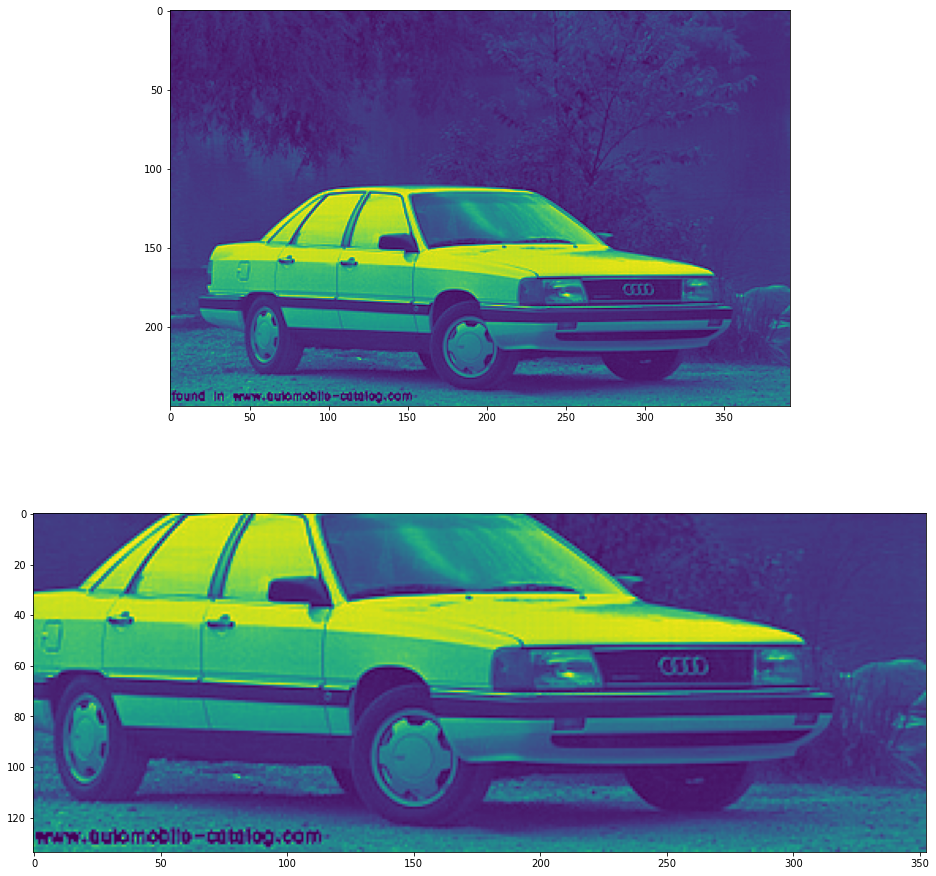

In [165]:
import matplotlib.pyplot as plt
im = plt.imread("cars_train/cars_train/" + str("02176.jpg"))
crop_im = im[y1:y2, x1:x2]
f, (ax1, ax2) = plt.subplots(2)
f.set_figheight(16)
f.set_figwidth(16)
ax1.imshow(im)
ax2.imshow(crop_im)
plt.show()

In [1]:
import torch

In [2]:
from torchvision.transforms import Resize, Compose, ToTensor, Normalize

In [5]:
tf = Compose([
    Resize((224, 224)),
        ToTensor(),
        Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
           ])

NameError: name 'Normalize' is not defined

In [ ]:
tf_image = tf(im)

In [3]:
from torch.utils.data import Dataset, DataLoader

In [4]:
import os
import json
import scipy.io
import matplotlib.pyplot as plt
from PIL import Image


class CarsDataset(Dataset):
    def __init__(self, images_path, meta_path, transform=None, target_transform=None):
        super().__init__()
        self.images_path = images_path
        self.meta_path = meta_path
        self.transform = transform
        self.target_transform = target_transform        
        self.meta = scipy.io.loadmat(self.meta_path)['annotations'][0]
        new_meta = []
        for i in tqdm(range(len(self.meta))):
            if self[i] is not None:
                new_meta.append(self.meta[i])
        self.meta = new_meta
        
    def __len__(self):
        return len(self.meta)
    
    def __getitem__(self, index):
        try:
            fname = str(self.meta[index]['fname'][0])
            x1 = int(self.meta[index]['bbox_x1'][0])
            y1 = int(self.meta[index]['bbox_y1'][0])
            x2 = int(self.meta[index]['bbox_x2'][0])
            y2 = int(self.meta[index]['bbox_y2'][0])

            target = torch.LongTensor(self.meta[index]['class'][0])
            image = Image.open(os.path.join(self.images_path, fname))
            image = image.crop((x1, y1, x2, y2))
            if self.transform:
                image = self.transform(image)
            if self.target_transform:
                target = self.target_transform(target)
            if image.shape[0] == 1:
                image = torch.cat([image, image, image])
            return image, target
        except Exception as e:
            print(e)
            return None

In [5]:
data = CarsDataset(
    images_path="/home/jupyter/datasphere/project/cars_train/cars_train",
    meta_path="/home/jupyter/datasphere/project/devkit/cars_train_annos.mat",
    transform=tf,
    target_transform=None
)

NameError: name 'tf' is not defined

In [ ]:
len(data)

In [ ]:
im, target = data[0]

In [ ]:
N_VIZ = 5
for idx in range(min(N_VIZ, len(data))):
    im1, target = data[idx]
    print(im1.shape)
    plt.imshow(torch.permute(im1, (1, 2, 0)))
    plt.show()

In [87]:
# %pip install pytorch-metric-learning
# %pip install faiss-gpu

In [6]:
from torch.distributions.categorical import Categorical

In [7]:
distr = Categorical(torch.Tensor([0.4, 0.4, 0.2]))

In [8]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from torchvision import datasets, transforms

from pytorch_metric_learning import distances, losses, miners, reducers, testers
from pytorch_metric_learning.utils.accuracy_calculator import AccuracyCalculator
from tqdm.notebook import tqdm


def train(model, loss_func, mining_func, device, train_loader, optimizer, epoch):
    model.to(device)
    model.train()
    for batch_idx, (data, labels) in enumerate(tqdm(train_loader)):
        data, labels = data.to(device), labels.to(device)
        optimizer.zero_grad()
        embeddings = model(data)
        indices_tuple = mining_func(embeddings, labels.squeeze(-1))
        loss = loss_func(embeddings, labels.squeeze(-1), indices_tuple)
        loss.backward()
        optimizer.step()
        if batch_idx % 20 == 0:
            print(
                "Epoch {} Iteration {}: Loss = {}".format(
                    epoch, batch_idx, loss
                )
            )


def get_all_embeddings(dataset, model):
    tester = testers.BaseTester()
    return tester.get_all_embeddings(dataset, model)


def test(train_set, val_set, test_set, model, accuracy_calculator):
    model.to(device)
    train_embeddings, train_labels = get_all_embeddings(train_set, model)
    val_embeddings, val_labels = get_all_embeddings(val_set, model)
    test_embeddings, test_labels = get_all_embeddings(test_set, model)
    train_labels = train_labels.squeeze(1)
    val_labels = val_labels.squeeze(1)
    test_labels = test_labels.squeeze(1)
    print("Computing accuracy")
    val_accuracies = accuracy_calculator.get_accuracy(
        val_embeddings, val_labels, train_embeddings, train_labels, False
    )    
    test_accuracies = accuracy_calculator.get_accuracy(
        test_embeddings, test_labels, train_embeddings, train_labels, False
    )
    print("Val set accuracy (Precision@1) = {}\n"
          "Tes set accuracy (Precision@1) = {}".format(
        val_accuracies["precision_at_1"],
        test_accuracies["precision_at_1"],       
    ))


device = torch.device("cuda")

transform = transforms.Compose(
    [ 
        transforms.Resize((224, 224), antialias=True),
        transforms.ToTensor(),
        # transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]
)

batch_size = 64

import torchvision
import torch

dataset = CarsDataset(
    images_path="/home/jupyter/datasphere/project/cars_train/cars_train",
    meta_path="/home/jupyter/datasphere/project/devkit/cars_train_annos.mat",
    transform=transform,
    target_transform=None
)

distr = Categorical(torch.Tensor([0.7, 0.15, 0.15]))
distr_samples = distr.sample(sample_shape=[len(dataset)])
train_dataset = torch.utils.data.Subset(dataset, torch.where(distr_samples == 0)[0])
val_dataset = torch.utils.data.Subset(dataset, torch.where(distr_samples == 1)[0])
test_dataset = torch.utils.data.Subset(dataset, torch.where(distr_samples == 2)[0])

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size,
                                            shuffle=True, num_workers=1)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size,
                                            shuffle=False, num_workers=1)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size,
                                            shuffle=False, num_workers=1)

  0%|          | 0/8144 [00:00<?, ?it/s]

In [9]:
from torchvision.models import vgg19_bn, vit_l_32

In [166]:
model = vit_l_32(pretrained=True)
model.heads = nn.Linear(1024, 1024)
optimizer = optim.Adam(model.parameters(), lr=1e-5)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ViT_L_32_Weights.IMAGENET1K_V1`. You can also use `weights=ViT_L_32_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [167]:
distance = distances.CosineSimilarity()

reducer = reducers.ThresholdReducer(low=0)
loss_func = losses.TripletMarginLoss(margin=0.2, distance=distance, reducer=reducer)
mining_func = miners.TripletMarginMiner(
    margin=0.2, distance=distance, type_of_triplets="semihard"
)

metrics = []
accuracy_calculator = AccuracyCalculator(include=("precision_at_1", ), k=1)

In [ ]:
for epoch in range(1, 31):
    train(model, loss_func, mining_func, device, train_loader, optimizer, epoch)
    test(train_dataset, val_dataset, test_dataset, model, accuracy_calculator)

  0%|          | 0/90 [00:00<?, ?it/s]

Epoch 1 Iteration 0: Loss = 0.09790351986885071
Epoch 1 Iteration 20: Loss = 0.10542917996644974
Epoch 1 Iteration 40: Loss = 0.09642733633518219
Epoch 1 Iteration 60: Loss = 0.0935114175081253
Epoch 1 Iteration 80: Loss = 0.09283188730478287


100%|██████████| 39/39 [00:06<00:00,  6.25it/s]

Computing accuracy


Val set accuracy (Precision@1) = 0.33249791144527985
Tes set accuracy (Precision@1) = 0.3108766233766234


  0%|          | 0/90 [00:00<?, ?it/s]

Epoch 2 Iteration 0: Loss = 0.0856078490614891
Epoch 2 Iteration 20: Loss = 0.09401504695415497
Epoch 2 Iteration 40: Loss = 0.09467323869466782
Epoch 2 Iteration 60: Loss = 0.09417939186096191
Epoch 2 Iteration 80: Loss = 0.10011444985866547


 74%|███████▎  | 28/38 [00:04<00:01,  7.25it/s]

Epoch 16 Iteration 40: Loss = 0.08943593502044678
Epoch 16 Iteration 60: Loss = 0.0891752615571022
Epoch 16 Iteration 80: Loss = 0.09518764168024063


100%|██████████| 39/39 [00:06<00:00,  6.30it/s]

Computing accuracy


Val set accuracy (Precision@1) = 0.5421888053467001
Tes set accuracy (Precision@1) = 0.5397727272727273


  0%|          | 0/90 [00:00<?, ?it/s]

Epoch 17 Iteration 0: Loss = 0.09938565641641617
Epoch 17 Iteration 20: Loss = 0.08592779189348221
Epoch 17 Iteration 40: Loss = 0.08788474649190903
Epoch 17 Iteration 60: Loss = 0.10459794849157333
Epoch 17 Iteration 80: Loss = 0.08740483224391937


100%|██████████| 39/39 [00:06<00:00,  6.25it/s]

Computing accuracy


Val set accuracy (Precision@1) = 0.5597326649958229
Tes set accuracy (Precision@1) = 0.5454545454545455


  0%|          | 0/90 [00:00<?, ?it/s]

Epoch 18 Iteration 0: Loss = 0.08468028903007507
Epoch 18 Iteration 20: Loss = 0.09561854600906372
Epoch 18 Iteration 40: Loss = 0.07663197815418243
Epoch 18 Iteration 60: Loss = 0.09033495932817459
Epoch 18 Iteration 80: Loss = 0.07151158154010773


100%|██████████| 39/39 [00:06<00:00,  6.24it/s]

Computing accuracy


Val set accuracy (Precision@1) = 0.5530492898913951
Tes set accuracy (Precision@1) = 0.5608766233766234


  0%|          | 0/90 [00:00<?, ?it/s]

Epoch 19 Iteration 0: Loss = 0.08802273869514465
Epoch 19 Iteration 20: Loss = 0.09538516402244568
Epoch 19 Iteration 40: Loss = 0.11006542295217514
Epoch 19 Iteration 60: Loss = 0.0820193886756897
Epoch 19 Iteration 80: Loss = 0.09379234910011292


100%|██████████| 39/39 [00:06<00:00,  6.29it/s]


Computing accuracy
Val set accuracy (Precision@1) = 0.5555555555555556
Tes set accuracy (Precision@1) = 0.5592532467532468


  0%|          | 0/90 [00:00<?, ?it/s]

Epoch 20 Iteration 0: Loss = 0.0943576917052269
Epoch 20 Iteration 20: Loss = 0.09397212415933609
Epoch 20 Iteration 40: Loss = 0.0958065539598465
Epoch 20 Iteration 60: Loss = 0.07493332773447037
Epoch 20 Iteration 80: Loss = 0.07894602417945862


100%|██████████| 39/39 [00:06<00:00,  6.34it/s]


Computing accuracy
Val set accuracy (Precision@1) = 0.5680868838763575
Tes set accuracy (Precision@1) = 0.5771103896103896


  0%|          | 0/90 [00:00<?, ?it/s]

Epoch 21 Iteration 0: Loss = 0.08934459090232849
Epoch 21 Iteration 20: Loss = 0.07993768155574799
Epoch 21 Iteration 40: Loss = 0.07291732728481293
Epoch 21 Iteration 60: Loss = 0.0782642662525177
Epoch 21 Iteration 80: Loss = 0.08559653162956238


100%|██████████| 39/39 [00:06<00:00,  6.29it/s]


Computing accuracy
Val set accuracy (Precision@1) = 0.5747702589807853
Tes set accuracy (Precision@1) = 0.5698051948051949


  0%|          | 0/90 [00:00<?, ?it/s]

Epoch 22 Iteration 0: Loss = 0.08983547985553741
Epoch 22 Iteration 20: Loss = 0.07585488259792328
Epoch 22 Iteration 40: Loss = 0.0776485800743103
Epoch 22 Iteration 60: Loss = 0.07770974189043045
Epoch 22 Iteration 80: Loss = 0.08490131050348282


100%|██████████| 39/39 [00:07<00:00,  5.52it/s]

Computing accuracy


Val set accuracy (Precision@1) = 0.5822890559732665
Tes set accuracy (Precision@1) = 0.5738636363636364


  0%|          | 0/90 [00:00<?, ?it/s]

Epoch 23 Iteration 0: Loss = 0.07814708352088928
Epoch 23 Iteration 20: Loss = 0.0927962139248848
Epoch 23 Iteration 40: Loss = 0.07419870048761368
Epoch 23 Iteration 60: Loss = 0.07517766952514648
Epoch 23 Iteration 80: Loss = 0.08434972167015076


100%|██████████| 39/39 [00:06<00:00,  5.70it/s]

Computing accuracy


Val set accuracy (Precision@1) = 0.5906432748538011
Tes set accuracy (Precision@1) = 0.575487012987013


  0%|          | 0/90 [00:00<?, ?it/s]

Epoch 24 Iteration 0: Loss = 0.054102517664432526
Epoch 24 Iteration 20: Loss = 0.07137291878461838
Epoch 24 Iteration 40: Loss = 0.07621671259403229
Epoch 24 Iteration 60: Loss = 0.08800029754638672
Epoch 24 Iteration 80: Loss = 0.07727256417274475


100%|██████████| 39/39 [00:06<00:00,  6.35it/s]

Computing accuracy


Val set accuracy (Precision@1) = 0.6131996658312447
Tes set accuracy (Precision@1) = 0.5827922077922079


  0%|          | 0/90 [00:00<?, ?it/s]

Epoch 25 Iteration 0: Loss = 0.07955475151538849
Epoch 25 Iteration 20: Loss = 0.09766177088022232
Epoch 25 Iteration 40: Loss = 0.07882508635520935
Epoch 25 Iteration 60: Loss = 0.08506419509649277
Epoch 25 Iteration 80: Loss = 0.09651153534650803


100%|██████████| 39/39 [00:06<00:00,  6.31it/s]

Computing accuracy


Val set accuracy (Precision@1) = 0.6015037593984962
Tes set accuracy (Precision@1) = 0.577922077922078


  0%|          | 0/90 [00:00<?, ?it/s]

Epoch 26 Iteration 0: Loss = 0.10139205306768417
Epoch 26 Iteration 20: Loss = 0.05291429162025452
Epoch 26 Iteration 40: Loss = 0.0746450424194336
Epoch 26 Iteration 60: Loss = 0.06649775803089142
Epoch 26 Iteration 80: Loss = 0.08258494734764099


100%|██████████| 39/39 [00:06<00:00,  6.31it/s]

Computing accuracy


Val set accuracy (Precision@1) = 0.6190476190476191
Tes set accuracy (Precision@1) = 0.5998376623376623


  0%|          | 0/90 [00:00<?, ?it/s]

Epoch 27 Iteration 0: Loss = 0.06561101227998734
Epoch 27 Iteration 20: Loss = 0.07816284894943237
Epoch 27 Iteration 40: Loss = 0.05893436819314957
Epoch 27 Iteration 60: Loss = 0.08537445962429047
Epoch 27 Iteration 80: Loss = 0.08735476434230804


100%|██████████| 39/39 [00:06<00:00,  6.27it/s]

Computing accuracy


Val set accuracy (Precision@1) = 0.6198830409356725
Tes set accuracy (Precision@1) = 0.612012987012987


  0%|          | 0/90 [00:00<?, ?it/s]

Epoch 28 Iteration 0: Loss = 0.11761655658483505
Epoch 28 Iteration 20: Loss = 0.08927974849939346
Epoch 28 Iteration 40: Loss = 0.07481004297733307
Epoch 28 Iteration 60: Loss = 0.109022356569767
Epoch 28 Iteration 80: Loss = 0.06458628177642822


100%|██████████| 39/39 [00:06<00:00,  6.27it/s]

Computing accuracy


Val set accuracy (Precision@1) = 0.6048454469507101
Tes set accuracy (Precision@1) = 0.5892857142857143


  0%|          | 0/90 [00:00<?, ?it/s]

Epoch 29 Iteration 0: Loss = 0.0896134078502655
Epoch 29 Iteration 20: Loss = 0.07036957144737244
Epoch 29 Iteration 40: Loss = 0.08816652745008469
Epoch 29 Iteration 60: Loss = 0.06060470640659332
Epoch 29 Iteration 80: Loss = 0.0845070406794548


100%|██████████| 39/39 [00:06<00:00,  6.27it/s]

Computing accuracy


Val set accuracy (Precision@1) = 0.6357560568086884
Tes set accuracy (Precision@1) = 0.5803571428571429


  0%|          | 0/90 [00:00<?, ?it/s]

Epoch 30 Iteration 0: Loss = 0.07929152995347977
Epoch 30 Iteration 20: Loss = 0.07685206830501556
Epoch 30 Iteration 40: Loss = 0.05746261030435562
Epoch 30 Iteration 60: Loss = 0.07838284224271774
Epoch 30 Iteration 80: Loss = 0.08011139184236526


100%|██████████| 39/39 [00:06<00:00,  6.25it/s]

Computing accuracy


Val set accuracy (Precision@1) = 0.6257309941520468
Tes set accuracy (Precision@1) = 0.6087662337662338


In [ ]:
torch.save(model.state_dict(), "vit_30ep.pb")

In [ ]:
import faiss


def compute_metrics(index, train_embeddings, train_labels, test_embeddings, test_labels, k):
    D, I = index.search(test_embeddings.to('cpu'), k)
    correct = train_labels[I] == test_labels.unsqueeze(-1)
    counts = torch.clip(torch.hstack((torch.LongTensor([0]).to(test_labels.device), torch.unique(test_labels, return_counts=True)[1])), 0, k)
    
    precision_at_k = torch.sum(torch.any(correct, dim=1)) / len(test_labels)
    recall_at_k = torch.sum(correct) / torch.sum(counts[test_labels])
    return precision_at_k.item(), recall_at_k.item()

In [ ]:
model.to(device)
train_embeddings, train_labels = get_all_embeddings(train_dataset, model)
val_embeddings, val_labels = get_all_embeddings(val_dataset, model)
test_embeddings, test_labels = get_all_embeddings(test_dataset, model)
train_labels = train_labels.squeeze(1)
val_labels = val_labels.squeeze(1)
test_labels = test_labels.squeeze(1)
norm_train_embeddings = train_embeddings / torch.norm(train_embeddings, p=2, dim=1, keepdim=True)
norm_test_embeddings = test_embeddings / torch.norm(test_embeddings, p=2, dim=1, keepdim=True)

100%|██████████| 39/39 [00:06<00:00,  6.39it/s]


In [ ]:
index = faiss.IndexFlatIP(1024)
index.add(norm_train_embeddings.to('cpu'))

In [ ]:
precision_at_1, recall_at_1 = compute_metrics(index, norm_train_embeddings, train_labels, norm_test_embeddings, test_labels, 1)
precision_at_5, recall_at_5 = compute_metrics(index, norm_train_embeddings, train_labels, norm_test_embeddings, test_labels, 5)

In [ ]:
print(f"{precision_at_1=}, {recall_at_1=}, {precision_at_5=}, {recall_at_5=}")

precision_at_1=0.6087662577629089, recall_at_1=0.6087662577629089, precision_at_5=0.7784090638160706, recall_at_5=0.569303572177887


In [59]:
model

VisionTransformer(
  (conv_proj): Conv2d(3, 1024, kernel_size=(32, 32), stride=(32, 32))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=1024, out_features=1024, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=1024, out_features=4096, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=4096, out_features=1024, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
       

In [66]:
import numpy as np
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

In [109]:
class VitWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model
        
    def forward(self, x):
        if len(x.shape) != 4:
            x = x.unsqueeze(0)
        return self.model(x)

## GradCAM поддерживает только image-like выходы, а в ViT'e из такого только первый слой :(, поэтому смотрим на него

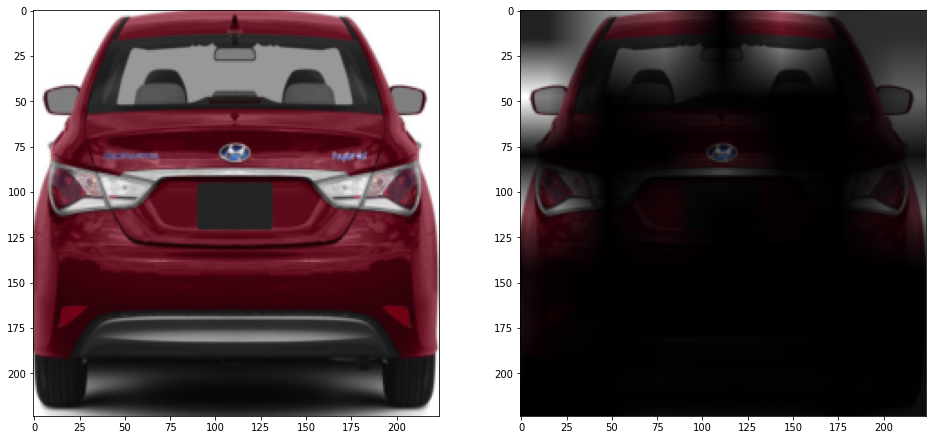

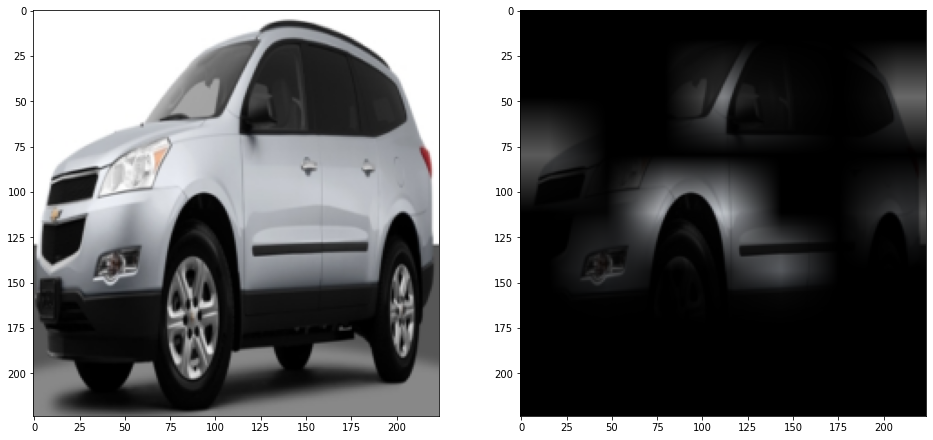

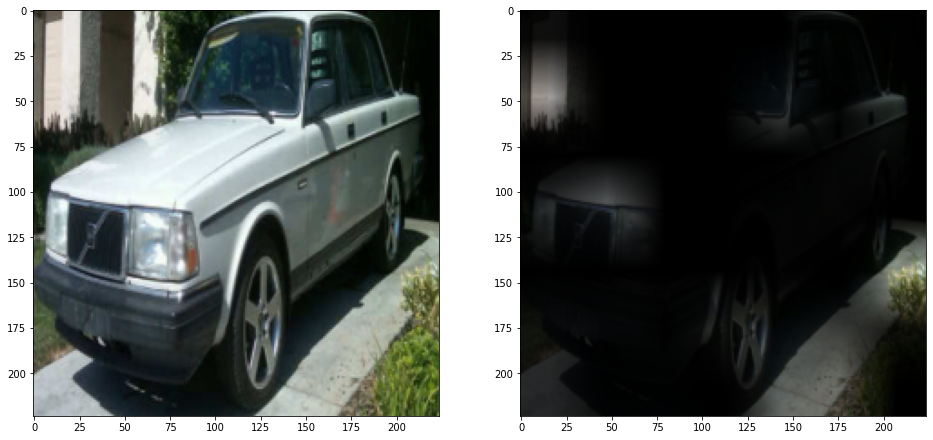

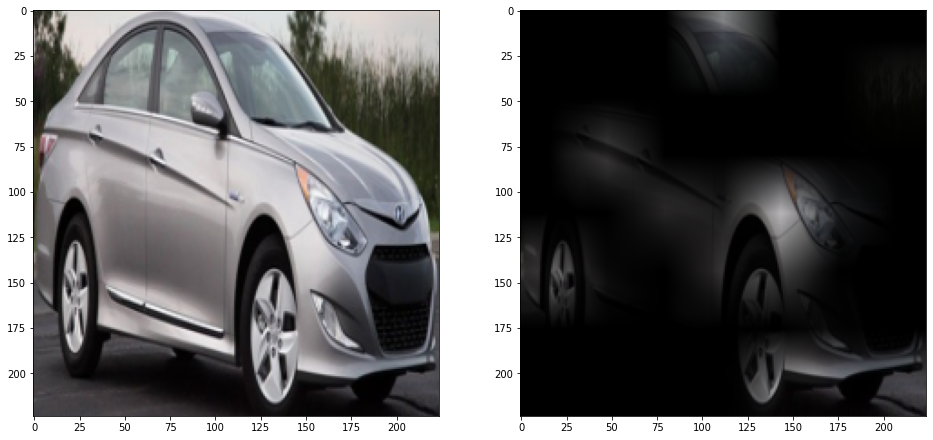

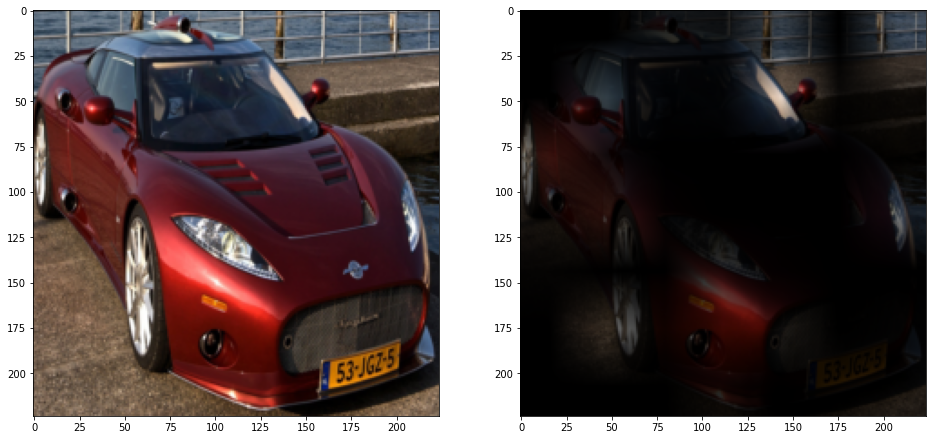

...

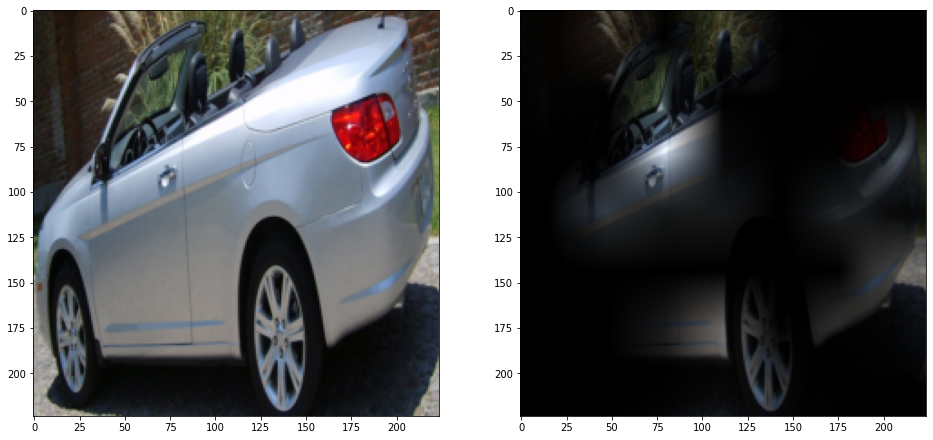

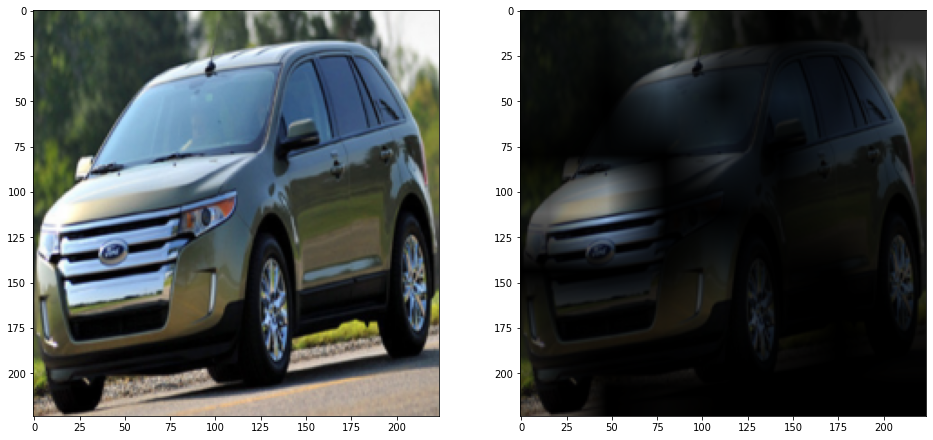

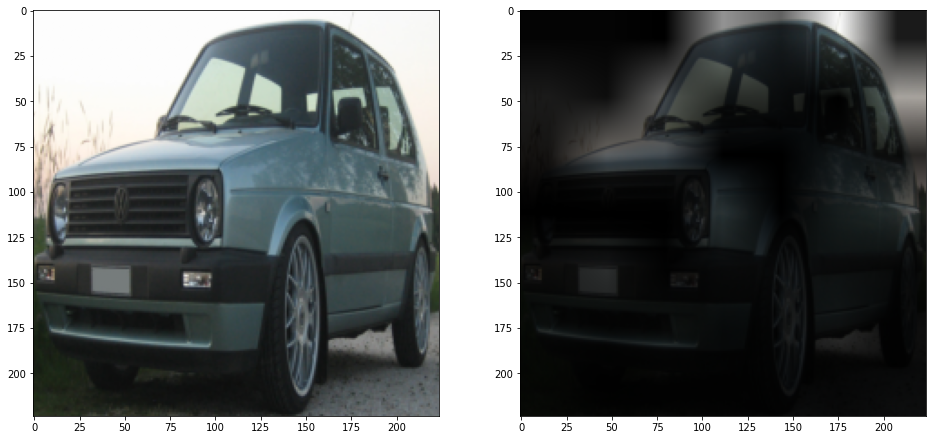

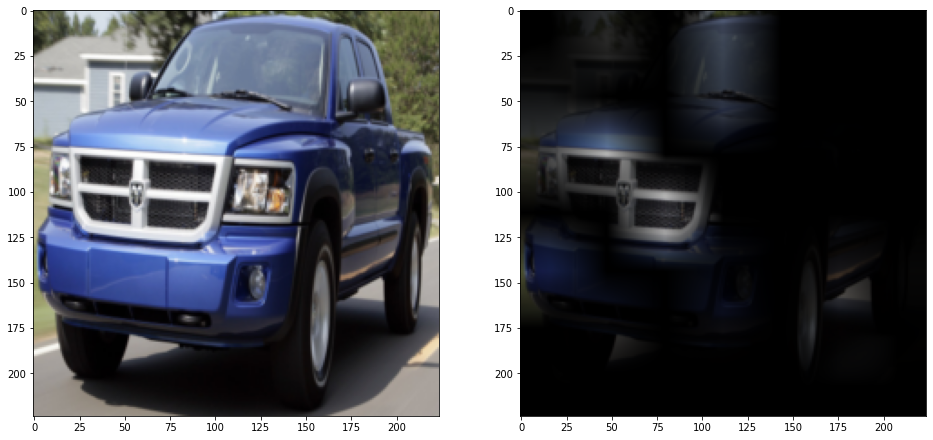

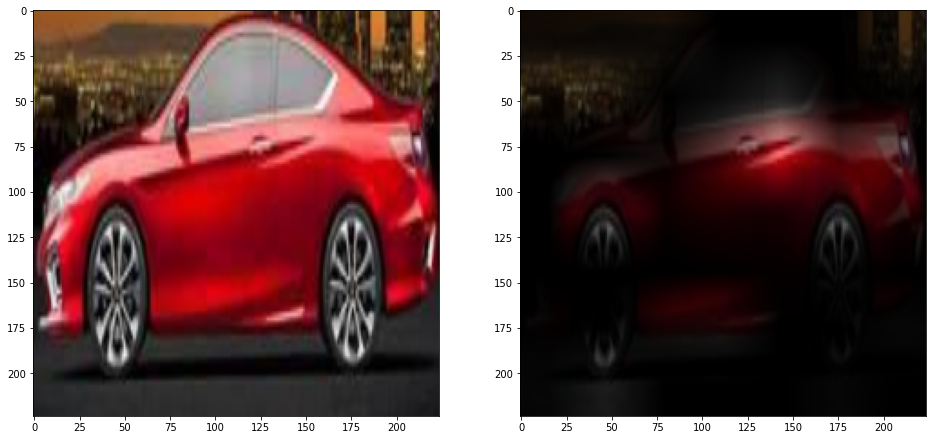

In [165]:
wrapper = VitWrapper(model)
N_VIZ = 30
target_layers = [model.conv_proj]
car_targets = [ClassifierOutputTarget(target)]

for idx in range(min(len(test_dataset), N_VIZ)):
    input_tensor, target = test_dataset[idx] 
    with GradCAM(model=wrapper,
                 target_layers=target_layers) as cam:
        car_grayscale_cam = cam(input_tensor=input_tensor,
                            targets=car_targets)

        f, (ax1, ax2) = plt.subplots(ncols=2)
        f.set_figheight(8)
        f.set_figwidth(16)
        ax1.imshow(np.transpose(input_tensor, (1, 2, 0)))
        ax2.imshow(np.transpose(input_tensor * car_grayscale_cam, (1, 2, 0)))
        plt.show()